In [13]:
import pandas as pd 
import numpy as np 
import sklearn
import json
import jieba
from tqdm import tqdm
from matplotlib import pyplot as plt
import plotly.graph_objs as go
import plotly.express as px
import plotly.io as pio
import plotly.offline as pyo
import matplotlib.ticker as ticker
import jieba.analyse


# words.txt', 'r', encoding = 'UTF-8')
# stopwords = []
# for i in f.read():
#     stopwords.append(i)
# f.close()
# pyo.init_notebook_mode()


In [79]:
poet = pd.read_csv('data/poet.csv')
print(poet.info())
print(poet.describe())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311824 entries, 0 to 311823
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   author          311824 non-null  object
 1   paragraphs      311824 non-null  object
 2   title           311656 non-null  object
 3   id              311824 non-null  object
 4   tags            11037 non-null   object
 5   strains         311824 non-null  object
 6   len             311824 non-null  int64 
 7   baidu           311824 non-null  int64 
 8   so360           311824 non-null  int64 
 9   bing            311824 non-null  int64 
 10  bing_en         311824 non-null  int64 
 11  google          311824 non-null  int64 
 12  rank            311824 non-null  int64 
 13  cut_parapraphs  311824 non-null  object
dtypes: int64(7), object(7)
memory usage: 33.3+ MB
None
                 len         baidu         so360          bing       bing_en  \
count  311824.000000  3.118240e+0

In [82]:
x = []
for i in range(40):
    cv = CountVectorizer(min_df = i)
    dtm = cv.fit_transform(poet['cut_parapraphs'])
    print("min_df", i, "total countvector dimension", len(cv.get_feature_names()))
    x.append(len(cv.get_feature_names()))

total countvector dimension 1529347
total countvector dimension 1529347
total countvector dimension 377010
total countvector dimension 213301
total countvector dimension 152470
total countvector dimension 120444
total countvector dimension 100075
total countvector dimension 86106
total countvector dimension 75674
total countvector dimension 67644
total countvector dimension 61272
total countvector dimension 56022
total countvector dimension 51727
total countvector dimension 48114
total countvector dimension 44919
total countvector dimension 42101
total countvector dimension 39648
total countvector dimension 37461
total countvector dimension 35559
total countvector dimension 33791
total countvector dimension 32304
total countvector dimension 30845
total countvector dimension 29535
total countvector dimension 28376
total countvector dimension 27259
total countvector dimension 26289
total countvector dimension 25332
total countvector dimension 24423
total countvector dimension 23582
total

In [109]:
fig = go.Figure(data=go.Scatter(x=list(range(40)), y=x))
fig.update_layout(
    title="Count",
    xaxis_title="min number of counts",
    yaxis_title="number of different words",
    legend_title="Legend Title",
    font=dict(
        family="Courier New, monospace",
        size=15,
        color="RebeccaPurple"
    )
)
fig.show()
# ,x = "min number of counts",y = "number of different words"

In [144]:
cv = CountVectorizer(min_df = 200, max_df=1000)
dtm = cv.fit_transform(poet['cut_parapraphs'])
print(len(cv.get_feature_names()))

2450


In [145]:
print(cv.get_feature_names()[-20:])
print(cv.get_feature_names()[:20])


['鴛鴦', '鷓鴣', '鸚鵡', '麋鹿', '麒麟', '黄卷', '黄塵', '黄昏', '黄梅', '黄河', '黄粱', '黄菊', '黄葉', '黄鸝', '默默', '點點', '鼓吹', '鼓角', '鼻孔', '龍門']
['一一', '一世', '一丘', '一事', '一二', '一人', '一代', '一任', '一何', '一作', '一出', '一分', '一切', '一別', '一半', '一卷', '一去', '一句', '一味', '一回']


In [146]:
x = cv.vocabulary_
x = dict(sorted(x.items(), key=lambda item: item[1], reverse=False))
# for i, j in x.items():
#     if j > 10:
#         print(i)
count = 0
for i, j in x.items():
    print(i, j)
    if count > 100:
        break
    count += 1

一一 0
一世 1
一丘 2
一事 3
一二 4
一人 5
一代 6
一任 7
一何 8
一作 9
一出 10
一分 11
一切 12
一別 13
一半 14
一卷 15
一去 16
一句 17
一味 18
一回 19
一壺 20
一夕 21
一天 22
一字 23
一官 24
一室 25
一家 26
一寸 27
一尊 28
一尺 29
一峰 30
一川 31
一幅 32
一廛 33
一徑 34
一從 35
一心 36
一念 37
一方 38
一旦 39
一曲 40
一月 41
一望 42
一條 43
一榻 44
一歲 45
一段 46
一毫 47
一氣 48
一水 49
一洗 50
一派 51
一滴 52
一燈 53
一物 54
一瓢 55
一番 56
一種 57
一篇 58
一紙 59
一舉 60
一般 61
一色 62
一葉 63
一行 64
一見 65
一觴 66
一言 67
一語 68
一路 69
一道 70
一醉 71
一長 72
一門 73
一雙 74
一雨 75
一飯 76
一首 77
一點 78
七十 79
七年 80
七月 81
丈人 82
三世 83
三五 84
三代 85
三伏 86
三公 87
三分 88
三十 89
三十六 90
三十年 91
三千里 92
三四 93
三子 94
三家 95
三尺 96
三山 97
三峰 98
三徑 99
三日 100
三昧 101


In [150]:
y = dtm.toarray()
print(len(y))

311824
[0 0 0 ... 0 0 0]


In [4]:
fstp = open('data/stopwords/_ch_poem.txt', 'r')
stopwords = []
for i in fstp.read():
    stopwords.append(i)



In [47]:
filter_poet = []
for i in tqdm(poet['paragraphs']):
    if i == '[]':
        print(i)
        break
    
    i = ''.join(list(filter(lambda x: x not in stopwords, i)))
    i = " ".join(list(jieba.lcut(i)))
    filter_poet.append(i)
poet['cut_parapraphs'] = filter_poet
print(poet.info())

  1%|          | 2048/311860 [00:01<02:53, 1784.99it/s][]



ValueError: Length of values (2048) does not match length of index (311860)

In [18]:
print(poet.info())


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 311860 entries, 0 to 311859
Data columns (total 14 columns):
 #   Column          Non-Null Count   Dtype 
---  ------          --------------   ----- 
 0   author          311860 non-null  object
 1   paragraphs      311860 non-null  object
 2   title           311691 non-null  object
 3   id              311860 non-null  object
 4   tags            11037 non-null   object
 5   strains         311860 non-null  object
 6   len             311860 non-null  int64 
 7   baidu           311860 non-null  int64 
 8   so360           311860 non-null  int64 
 9   bing            311860 non-null  int64 
 10  bing_en         311860 non-null  int64 
 11  google          311860 non-null  int64 
 12  rank            311860 non-null  int64 
 13  cut_parapraphs  311860 non-null  object
dtypes: int64(7), object(7)
memory usage: 33.3+ MB
None


In [8]:
print(filter_poet[:3])

['欲出 未出 光辣達 ， 千山 萬山 如火發 。 ,   須臾 走向 天上 來 ， 逐却 殘星 趕 却 月 。', '未離 海底 千山 黑 ， 纔 到 天中 萬國明 。', '滿目 江山 四望 幽 ， 白雲高卷 嶂 烟收 。 ,   日 回禽 影穿 疏木 ， 風遞 猿 聲入 小樓 。 ,   遠岫似 屏橫 碧落 ， 斷帆 如葉截 中流 。']


In [58]:
from sklearn.feature_extraction.text import TfidfTransformer
tfidf_transformer = TfidfTransformer()
tfidf_transformer.fit(poet['cut_parapraphs'])


AttributeError: 'Series' object has no attribute 'toarray'

In [7]:
from sklearn.feature_extraction.text import TfidfVectorizer
corpus = [
     'This is the first document .',
     'This document is the second document .',
     'And this is the third one .',
     'Is this the first document ?',
 ]
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(corpus)
print(X.shape)
feature_array = np.array(vectorizer.get_feature_names())
print(vectorizer.get_feature_names()[:3])
tfidf_sorting = np.argsort(X.toarray()).flatten()[::-1]
print(X.toarray())
print(np.argsort(X.toarray()))
print(np.argsort(X.toarray()).flatten())
print(np.argsort(X.toarray()).flatten()[::-1])
n = 3
top_n = feature_array[tfidf_sorting][:n]
print(top_n)

(4, 9)
['and', 'document', 'first']
[[0.         0.46979139 0.58028582 0.38408524 0.         0.
  0.38408524 0.         0.38408524]
 [0.         0.6876236  0.         0.28108867 0.         0.53864762
  0.28108867 0.         0.28108867]
 [0.51184851 0.         0.         0.26710379 0.51184851 0.
  0.26710379 0.51184851 0.26710379]
 [0.         0.46979139 0.58028582 0.38408524 0.         0.
  0.38408524 0.         0.38408524]]
[[0 4 5 7 3 6 8 1 2]
 [0 2 4 7 3 6 8 5 1]
 [1 2 5 3 6 8 0 4 7]
 [0 4 5 7 3 6 8 1 2]]
[0 4 5 7 3 6 8 1 2 0 2 4 7 3 6 8 5 1 1 2 5 3 6 8 0 4 7 0 4 5 7 3 6 8 1 2]
[2 1 8 6 3 7 5 4 0 7 4 0 8 6 3 5 2 1 1 5 8 6 3 7 4 2 0 2 1 8 6 3 7 5 4 0]
['first' 'document' 'this']


In [12]:
from sklearn.feature_extraction.text import CountVectorizer
cv = CountVectorizer(max_df = 0.9, min_df =2)
dtm = cv.fit_transform(poet['cut_parapraphs'])
# from sklearn.decomposition import LatentDirichletAllocation
# LDA = LatentDirichletAllocation(n_components=5, random_state=42)
# LDA.fit(dtm)



ValueError: np.nan is an invalid document, expected byte or unicode string.

In [ ]:
for i,topic in enumerate(LDA.components_):
    print(f"TOP 10 WORDS PER TOPIC #{i}")
    print([cv.get_feature_names()[index] for index in topic.argsort()[-10:]])

In [72]:
from sklearn.metrics.pairwise import cosine_similarity
print(cosine_similarity(X=[[1, 1]], Y=[[1, 1]]))

[[1.]]


In [54]:
print(poet['cut_parapraphs'].iloc[0:3])
print(poet['paragraphs'].iloc[1])

0    欲出 未出 光辣達 ， 千山 萬山 如火發 。 ,   須臾 走向 天上 來 ， 逐却 殘星...
1                            未離 海底 千山 黑 ， 纔 到 天中 萬國明 。
2    滿目 江山 四望 幽 ， 白雲高卷 嶂 烟收 。 ,   日 回禽 影穿 疏木 ， 風遞 猿...
Name: cut_parapraphs, dtype: object
['未離海底千山黑，纔到天中萬國明。']


[]

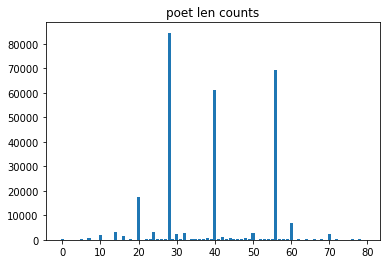

In [93]:
# draw poet length
tick_spacing = 5
x_range = 80
x = range(x_range)
count = [0 for i in range(x_range)]
for i in poet['len']:
    try:
        count[int(i)] += 1            
    except:
#         print(int(i))
        pass
y = count 
plt.bar(x, y)
# plt.set_major_locator(ticker.MultipleLocator(tick_spacing))
plt.title('poet len counts')
plt.plot()
# data_canada = px.data.gapminder().query("country == 'Canada'")
# fig = px.bar(poet, x='Unnamed: 0', y='len')
# fig.show()
# print(poet['Unnamed: 0'].iloc[-10:])

In [102]:
from src.dset._ch_poem import chpoemdset
from transformers import *
tokenizer =  AutoTokenizer.from_pretrained('bert-base-chinese')
poem_train = chpoemdset("train", tokenizer, 252)
poem_test = chpoemdset("test", tokenizer, 252)
poem_dset = chpoemdset("all", tokenizer, 252)

In [104]:
#author count
author = []
author_count = []
total_count = 0
for i, j in poem_dset.c.most_common():
    author.append(i)
    author_count.append(j)
    total_count += 1
print("total autor", total_count)
print(poem_dset.len_lbl())
print(poem_dset.check_author())

total autor 12368
300


AttributeError: 'chpoemdset' object has no attribute 'check_author'

In [109]:
print(author[:20])
for i, j in poem_dset.c.most_common():
    if i == "白居易":
        print(j)

['陸游', '劉克莊', '楊萬里', '趙蕃', '白居易', '梅堯臣', '方回', '蘇軾', '韓淲', '張耒', '黄庭堅', '王十朋', '陳造', '范成大', '周紫芝', '蘇轍', '釋德洪', '王安石', '劉敞', '釋居簡']
3009


In [98]:
print(type(range(total_count)))
fig = go.Figure(data=go.Scatter(x=list(range(total_count)), y=author_count))
fig.show()

<class 'range'>


In [3]:
from src.dset._ch_poem import chpoemdset_tag
from transformers import *
tokenizer =  AutoTokenizer.from_pretrained('bert-base-chinese')
tags_train = chpoemdset_tag("train", tokenizer, 0)
tags_test = chpoemdset_tag("test", tokenizer, 0)
tags_dset = chpoemdset_tag("all", tokenizer, 0)

reload ch poem


In [4]:
#tags count
tag = []
tag_count = []
total_count = 0
for i, j in tags_dset.c.most_common():
    tag.append(i)
    tag_count.append(j)
    total_count += 1
print("total tag", total_count)
tags_dset.to_csv("data/tags.csv")

total tag 2183


In [7]:
print(tag[:20])

["['西湖']", "['庐山']", "['洞庭湖']", "['长江']", "['衡山']", "['泰山']", "['太湖']", "['黄河']", "['钱塘江']", "['华山']", "['滕王阁']", "['岳阳楼']", "['九华山']", "['终南山']", "['洞庭湖', '岳阳楼']", "['太湖', '洞庭湖']", "['黄山']", "['抒情', '写景']", "['送别']", "['抒情']"]


In [5]:
print(type(range(total_count)))
fig = go.Figure(data=go.Scatter(x=list(range(total_count)), y=tag_count))
fig.show()

<class 'range'>


In [8]:
#tag count
tag = []
tag_count = []
total_count = 0
for i, j in poem_dset.c.most_common():
    author.append(i)
    author_count.append(j)
    total_count += 1
print("total tag", total_count)


KeyError: 'author'

In [110]:
from src.dset._ch_poem import chpoemdset_gen_author
from transformers import *
tokenizer =  AutoTokenizer.from_pretrained('bert-base-chinese')
gen_poem = chpoemdset_gen_author(tokenizer, "李白")

ImportError: cannot import name 'chpoemdset_gen_author' from 'src.dset._ch_poem' (/home/shangrex/program/Novel_NLP/src/dset/_ch_poem.py)

6420


[]

plotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 34314 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/shangrex/program/test/chinese-poetry/.venv/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 33655 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/shangrex/program/test/chinese-poetry/.venv/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 20499 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/shangrex/program/test/chinese-poetry/.venv/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 28542 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/shangrex/program/test/chinese-poetry/.venv/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 37728 missing from current font.
  font.set_text(s, 0, flags=flags)
/home/shangrex/program/test/chinese-poetry/.v

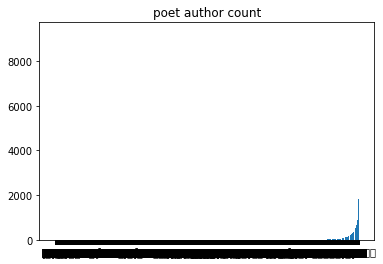

In [15]:
y, x = zip(*sorted(zip(author_count, author_name)))
# # x = author_name
# # y = author_count
# print(x[:15])
# x = x[:15]
# y = y[:15]
count = 0
for i in y:
    if i > 1:
        break
    else:
        count += 1
print(count)
plt.title('poet author count')
plt.bar(x, y)
plt.plot()

In [97]:
#tokenize poet
def character_tokenize(txt: str):
    tknzr = []
    for i in txt:
        tknzr.append(i)
    return set(tknzr)
def jieba_tokenize(txt: str):
    tknzr = []
    tknzr = jieba.lcut(txt)
    return set(tknzr)

In [99]:
#tokenizer test
s = "hello world"
x = "床前明月光，泥四地上雙。"
print(tokenizer(x))

['床', '前', '明', '月', '光', '，', '泥', '四', '地', '上', '雙', '。']


In [103]:
#trian tokenizer
word = ()
for i in tqdm(poet['paragraphs']):
    for j in i:
        word = set([*word, *tokenizer(j)])

100%|██████████| 311269/311269 [18:40<00:00, 277.79it/s]


In [107]:
print(len(word))

12902


In [111]:
l_word = list(word)
f = open('word.json', 'w')
json.dump(l_word, f)

In [112]:
f = open('word.json', 'r')
cool = json.load(f)

In [113]:
print(len(cool))

12902


In [16]:
from sklearn.preprocessing import OneHotEncoder

one_hot = OneHotEncoder()
author = ['i', 'am', 'a', 'handsome', 'guy']
one_hot.fit([author])
print("test")
print(one_hot.transform([['i']]))


test


ValueError: The number of features in X is different to the number of features of the fitted data. The fitted data had 5 features and the X has 1 features.